## 1. Imports

In [38]:

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error, mean_absolute_error

np.set_printoptions(precision=5, suppress=True)


## 2. Load the same COMSOL dataset 

In [39]:

# Kaggle path used in the original notebooks.
# Change only this path if your dataset is mounted elsewhere.
dir_path = '/kaggle/input/datasets/deveshppawar/comsol-data'

rows = []
for root, _, filenames in os.walk(dir_path):
    for file in filenames:
        if file.endswith('.csv') and file.startswith('data_t'):
            print(file)
            t = float(file.split('_t')[1].split('.')[0])
            df = pd.read_csv(os.path.join(root, file), sep=';')
            df_actual = df[7:]
            for i in range(len(df_actual)):
                vals = list(map(float, df_actual.iloc[i].values[0].split(',')))
                rows.append(vals + [t])

X = pd.DataFrame(rows, columns=['x', 'y', 'z', 'temp', 't'])

# Add the steady-state solution at t = 100 s, exactly as in the PINN notebook.
u_steady = pd.read_csv(os.path.join(dir_path, 'data_steady.csv'), sep=';')
u_actual = u_steady[7:]
rows_s = []
for i in range(len(u_actual)):
    vals = list(map(float, u_actual.iloc[i].values[0].split(',')))
    rows_s.append(vals + [100.0])
X_s = pd.DataFrame(rows_s, columns=['x', 'y', 'z', 'temp', 't'])

X = pd.concat([X, X_s], ignore_index=True)

print(f'Total rows: {len(X):,}')
print('Times:', np.unique(X['t']))
print(X.head())


data_t1.csv
data_t5.csv
data_t8.csv
data_t3.csv
data_t10.csv
data_t4.csv
data_t7.csv
data_t6.csv
data_t2.csv
data_t9.csv
Total rows: 47,146
Times: [  1.   2.   3.   4.   5.   6.   7.   8.   9.  10. 100.]
          x         y        z        temp    t
0  0.176561  0.050000  0.24539  316.989704  1.0
1  0.173333  0.050000  0.25000  316.974932  1.0
2  0.169895  0.050000  0.24539  317.014041  1.0
3  0.097851  0.027727  0.25000  312.123114  1.0
4  0.100093  0.033282  0.25000  313.111542  1.0


## 3. Physical parameters and common sensor split

In [40]:

# Physical parameters — kept identical to the PINN notebook.
rho = 15.0
cp = 200.0
h = 15.0
q_flux = 2000.0
T_inf = 300.0
kx = 41.0
ky = 7.0
kz = 41.0

seed = 42
n_sensors = 20

# Physical domain.
Lx, Ly, Lz = 0.2, 0.05, 0.25
t_min = 0.0                  # exact IC time
t_max = float(X['t'].max()) # 100 s
T_initial = 300.0

T_data = X['temp'].to_numpy(dtype=float)
X_data = X[['x', 'y', 'z', 't']].to_numpy(dtype=float)

# Select spatial sensor locations exactly as in the PINN notebook.
rng = np.random.RandomState(seed)
xyz = X[['x', 'y', 'z']].to_numpy()
unique_xyz, inverse = np.unique(xyz, axis=0, return_inverse=True)

n_sensors = min(n_sensors, unique_xyz.shape[0])
sensor_loc_idx = rng.choice(unique_xyz.shape[0], size=n_sensors, replace=False)
sensor_mask = np.isin(inverse, sensor_loc_idx)

X_train = X_data[sensor_mask]
T_train = T_data[sensor_mask]

print(f'Training rows: {len(X_train):,}')

Training rows: 220


## 4. Nondimensionalization and time transform

In [41]:

# Temperature transform:
#     u = (T - T_inf) / T_scale
# A physics-based scale avoids using test-set temperatures for normalization.
T_scale = max(50.0, q_flux / max(h, 1e-12), q_flux * Ly / max(ky, 1e-12))

# Thermal diffusivities.
alpha_x = kx / (rho * cp)
alpha_y = ky / (rho * cp)
alpha_z = kz / (rho * cp)

# Conservative characteristic diffusion time: the minimum domain diffusion time.
t_char = min(Lx**2 / alpha_x, Ly**2 / alpha_y, Lz**2 / alpha_z)

# Log-stretched time coordinate:
#     s(t) = 2*log(1+t/t_char)/log(1+t_max/t_char) - 1
# This maps [0, t_max] -> [-1, 1] and strongly expands the early transient.
_log_den = np.log1p(t_max / t_char)

def time_to_s(t):
    t = np.asarray(t, dtype=float)
    return 2.0 * np.log1p(t / t_char) / _log_den - 1.0

def ds_dt(t):
    t = np.asarray(t, dtype=float)
    return 2.0 / (_log_den * (t_char + t))

def normalize_xyz(Xphys):
    Xphys = np.asarray(Xphys, dtype=float)
    out = np.empty_like(Xphys, dtype=float)
    out[:, 0] = 2.0 * Xphys[:, 0] / Lx - 1.0
    out[:, 1] = 2.0 * Xphys[:, 1] / Ly - 1.0
    out[:, 2] = 2.0 * Xphys[:, 2] / Lz - 1.0
    out[:, 3] = time_to_s(Xphys[:, 3])
    return out

def temperature_to_u(T):
    return (np.asarray(T, dtype=float) - T_inf) / T_scale

def u_to_temperature(u):
    return T_inf + T_scale * np.asarray(u, dtype=float)

# Dimensionless PDE coefficients.
# Starting from:
#   kx*T_xx + ky*T_yy + kz*T_zz - rho*cp*T_t = 0
# divide by rho*cp and multiply by t_char.
# The normalized spatial derivatives introduce (2/L)^2.
bx = t_char * alpha_x * (2.0 / Lx)**2
by = t_char * alpha_y * (2.0 / Ly)**2
bz = t_char * alpha_z * (2.0 / Lz)**2

print(f'T_scale = {T_scale:.4g} K')
print(f'alpha = ({alpha_x:.6g}, {alpha_y:.6g}, {alpha_z:.6g}) m^2/s')
print(f't_char = {t_char:.6g} s')
print(f'PDE spatial coefficients = ({bx:.6g}, {by:.6g}, {bz:.6g})')
print(f's(t=1s) = {time_to_s(1.0):.4f}, s(t=10s) = {time_to_s(10.0):.4f}, s(t=100s) = {time_to_s(100.0):.4f}')


T_scale = 133.3 K
alpha = (0.0136667, 0.00233333, 0.0136667) m^2/s
t_char = 1.07143 s
PDE spatial coefficients = (1.46429, 4, 0.937143)
s(t=1s) = -0.7100, s(t=10s) = 0.0273, s(t=100s) = 1.0000


## 5. Collocation strategy: deliberately resolve the fast transient

In [42]:

# Unlike the previous nt=11 tensor grid, collocation is sampled directly in
# spacetime. A large fraction is concentrated in 0--10 s because the thermal
# transient is much faster than the full 0--100 s domain.

N_PDE = 20000
N_BC_PER_FACE = 1000
N_IC = 2000

# Hidden nodes: 800 is a practical default for a dense double-precision solve.
# Increase to 1000 if memory/time permits.
HIDDEN_NODES = 1000

# Fraction of PDE/BC time samples placed in the transient interval.
EARLY_FRACTION = 0.70
TRANSIENT_END = 10.0

rng_colloc = np.random.default_rng(seed)

def sample_time(n, rng=rng_colloc):
    n_early = int(round(n * EARLY_FRACTION))
    n_late = n - n_early

    t_early = rng.uniform(t_min, min(TRANSIENT_END, t_max), n_early)
    if n_late:
        t_late = rng.uniform(min(TRANSIENT_END, t_max), t_max, n_late)
        t = np.concatenate([t_early, t_late])
    else:
        t = t_early
    rng.shuffle(t)
    return t

def sample_interior(n, rng=rng_colloc):
    P = np.empty((n, 4), dtype=float)
    P[:, 0] = rng.uniform(0.0, Lx, n)
    P[:, 1] = rng.uniform(0.0, Ly, n)
    P[:, 2] = rng.uniform(0.0, Lz, n)
    P[:, 3] = sample_time(n, rng)
    return P

def sample_face(axis, coord, n, rng=rng_colloc):
    P = np.empty((n, 4), dtype=float)
    P[:, 0] = rng.uniform(0.0, Lx, n)
    P[:, 1] = rng.uniform(0.0, Ly, n)
    P[:, 2] = rng.uniform(0.0, Lz, n)
    P[:, axis] = coord
    P[:, 3] = sample_time(n, rng)
    return P

def sample_initial(n, rng=rng_colloc):
    P = np.empty((n, 4), dtype=float)
    P[:, 0] = rng.uniform(0.0, Lx, n)
    P[:, 1] = rng.uniform(0.0, Ly, n)
    P[:, 2] = rng.uniform(0.0, Lz, n)
    P[:, 3] = 0.0
    return P

X_pde = sample_interior(N_PDE)
X_ic = sample_initial(N_IC)

# Six faces; y=y_max is the applied heat-flux face.
face_specs = [
    ('neumann_flux', 1, Ly, -1.0, 'y = Ly'),
    ('convection',   1, 0.0,  1.0, 'y = 0'),
    ('convection',   0, 0.0,  1.0, 'x = 0'),
    ('convection',   0, Lx,   -1.0, 'x = Lx'),
    ('convection',   2, 0.0,  1.0, 'z = 0'),
    ('convection',   2, Lz,   -1.0, 'z = Lz'),
]

X_bc = []
for bc_type, axis, coord, face_sign, name in face_specs:
    X_bc.append(sample_face(axis, coord, N_BC_PER_FACE))
X_bc = np.concatenate(X_bc, axis=0)

print('PDE collocation:', X_pde.shape)
print('BC collocation:', X_bc.shape)
print('IC collocation:', X_ic.shape)


PDE collocation: (20000, 4)
BC collocation: (6000, 4)
IC collocation: (2000, 4)


## 6. PIELM implementation

In [43]:

class PIELM:
    
    def __init__(self, hidden_nodes=800, seed=42, fast_fraction=0.25, fast_band=8.0, slow_band=1.5, ridge=1e-8):
        self.N = int(hidden_nodes)
        self.seed = int(seed)
        self.fast_fraction = float(fast_fraction)
        self.fast_band = float(fast_band)
        self.slow_band = float(slow_band)
        self.ridge = float(ridge)

        self.W = None
        self.b = None
        self.c = None
        self.column_scale = None
        self.operator_condition = None

    @staticmethod
    def _phi(z):
        return np.tanh(z)

    @staticmethod
    def _phi_p(z):
        t = np.tanh(z)
        return 1.0 - t*t

    @staticmethod
    def _phi_pp(z):
        t = np.tanh(z)
        return -2.0 * t * (1.0 - t*t)

    def _z(self, Xn):
        return Xn @ self.W.T + self.b[None, :]

    def _H_base(self, Xn):
        # First column is an explicit constant feature.
        return np.column_stack([np.ones(len(Xn)), self._phi(self._z(Xn))]) #Explicit constant basis function

    def _H_value(self, Xphys):
        return self._H_base(normalize_xyz(Xphys))

    def _H_spatial_derivative(self, Xphys, axis):
        Xn = normalize_xyz(Xphys)
        z = self._z(Xn)
        phip = self._phi_p(z)
        scale = [2.0/Lx, 2.0/Ly, 2.0/Lz][axis]
        d = phip * self.W[:, axis][None, :] * scale
        return np.column_stack([np.zeros(len(Xphys)), d])

    def _H_pde(self, Xphys):
        """Rows of the dimensionless PDE operator on the basis."""
        Xn = normalize_xyz(Xphys)
        z = self._z(Xn)
        phip = self._phi_p(z)
        phipp = self._phi_pp(z)

        # bx, by, bz already contain the physical derivative scaling
        # t_char * alpha_i * (2/L_i)^2, so only W_i^2 is needed here.
        spatial = phipp * (
            bx * self.W[:, 0]**2
            + by * self.W[:, 1]**2
            + bz * self.W[:, 2]**2
        )

        # u_t = u_s * ds/dt. The constant basis has zero derivative.
        time_factor = t_char * ds_dt(Xphys[:, 3])[:, None]
        temporal = phip * self.W[:, 3][None, :] * time_factor

        return np.column_stack([
            np.zeros(len(Xphys)),
            spatial - temporal,
        ])

    def _H_bc(self, Xphys, bc_type, axis, face_sign):
        """Rows of consistently scaled boundary operators."""
        Hval = self._H_base(normalize_xyz(Xphys))
        Hd = self._H_spatial_derivative(Xphys, axis)
        k = [kx, ky, kz][axis]

        if bc_type == 'convection':
            # Original: sign*k*dT/dn - h*(T-Tinf)=0.
            # With T=Tinf+T_scale*u and division by h:
            # sign*(k/h)*du/dn - u = 0.
            return face_sign * (k/h) * Hd - Hval

        if bc_type == 'neumann_flux':
            # Original: sign*k*dT/dn + q_flux = 0.
            # Divide by q_flux/T_scale:
            # sign*k*T_scale/q_flux*du/dn + 1 = 0.
            return face_sign * (k*T_scale/q_flux) * Hd

        raise ValueError(f'Unknown boundary condition: {bc_type}')

    def _bc_rhs(self, bc_type, n):
        if bc_type == 'convection':
            # In transformed variable the RHS is zero.
            return np.zeros((n, 1))
        if bc_type == 'neumann_flux':
            # Because the constant basis derivative is zero, the +1 in the
            # scaled flux equation appears as RHS -1.
            return -np.ones((n, 1))
        raise ValueError(f'Unknown boundary condition: {bc_type}')

    def _random_features(self, seed):
        rng = np.random.default_rng(seed)
        n_fast = int(round(self.N * self.fast_fraction))
        n_slow = self.N - n_fast

        Wxyz = rng.uniform(-np.sqrt(3.0), np.sqrt(3.0), size=(self.N, 3))
        Wt = np.concatenate([
            rng.uniform(-self.slow_band, self.slow_band, size=n_slow),
            rng.uniform(-self.fast_band, self.fast_band, size=n_fast),
        ])
        rng.shuffle(Wt)

        W = np.column_stack([Wxyz, Wt])
        b = rng.uniform(-1.0, 1.0, size=self.N)
        return W, b

    @staticmethod
    def _stack_scaled_blocks(blocks, rhs_blocks, weights):
        """Normalize each block by sqrt(number of rows), then apply weight."""
        H_out, K_out = [], []
        for H, K, w in zip(blocks, rhs_blocks, weights):
            scale = float(w) / np.sqrt(max(len(H), 1))
            H_out.append(H * scale)
            K_out.append(K * scale)
        return np.vstack(H_out), np.vstack(K_out)

    def _build_operator_blocks_for_candidate(self, W, b, X_pde_p, X_bc_p, X_ic_p, X_data_p, T_data_p):
        """ Build the PDE, BC, IC, and data blocks for a candidate random-feature set."""
        self.W, self.b = W, b

        H_pde = self._H_pde(X_pde_p)
        K_pde = np.zeros((len(X_pde_p), 1))

        H_bc_parts, K_bc_parts = [], []
        cursor = 0
        for bc_type, axis, coord, face_sign, name in face_specs:
            # X_bc_p contains all faces in the order defined above.
            Xf = X_bc_p[cursor:cursor + N_BC_PER_FACE]
            cursor += N_BC_PER_FACE
            H_bc_parts.append(self._H_bc(Xf, bc_type, axis, face_sign))
            K_bc_parts.append(self._bc_rhs(bc_type, len(Xf)))
        H_bc = np.vstack(H_bc_parts)
        K_bc = np.vstack(K_bc_parts)

        H_ic = self._H_value(X_ic_p)
        K_ic = np.zeros((len(X_ic_p), 1))

        H_data = self._H_value(X_data_p)
        K_data = temperature_to_u(T_data_p).reshape(-1, 1)

        return [H_pde, H_bc, H_ic, H_data], [K_pde, K_bc, K_ic, K_data]

    def _choose_features(self, X_pde_p, X_bc_p, X_ic_p, X_data_p, T_data_p, n_trials=5):
        """ build the W and b random features using condition numberby scoring candidates on a small pilot subset of the actual operator structure."""
        best = None
        best_cond = np.inf

        # Use a small pilot subset of the actual operator structure.
        rng = np.random.default_rng(self.seed + 12345)
        npde = min(2500, len(X_pde_p))
        nbc = min(150, N_BC_PER_FACE)
        nic = min(300, len(X_ic_p))
        ndata = min(200, len(X_data_p))

        Xp = X_pde_p[rng.choice(len(X_pde_p), npde, replace=False)]
        Xic = X_ic_p[rng.choice(len(X_ic_p), nic, replace=False)]
        Xdata = X_data_p[rng.choice(len(X_data_p), ndata, replace=False)]
        # The RHS is irrelevant for condition-number scoring; the pilot
        # data rows are included only to reproduce the operator structure.

        # For BC pilot selection, take nbc rows from each face.
        bc_indices = []
        for j in range(len(face_specs)):
            lo = j * N_BC_PER_FACE
            hi = lo + N_BC_PER_FACE
            chosen = rng.choice(np.arange(lo, hi), nbc, replace=False)
            bc_indices.extend(chosen.tolist())
        Xbc = X_bc_p[np.array(bc_indices)]

        for trial in range(n_trials):
            W, b = self._random_features(self.seed + trial)
            blocks, rhs = self._build_operator_blocks_for_candidate(
                W, b, Xp, Xbc, Xic, Xdata, T_data_p[:ndata]
            )
            Hpilot, Kpilot = self._stack_scaled_blocks(
                blocks, rhs, weights=[1.0, 1.0, 1.0, 5.0]
            )

            # Column normalization is part of the final solve, so use the
            # same normalization while scoring candidates.
            col_scale = np.linalg.norm(Hpilot, axis=0)
            col_scale = np.maximum(col_scale, 1e-12)
            Hpilot_n = Hpilot / col_scale

            # SVD of the pilot operator is the relevant conditioning metric.
            sv = np.linalg.svd(Hpilot_n, compute_uv=False)
            cond = sv[0] / max(sv[-1], 1e-14)

            if cond < best_cond:
                best_cond = cond
                best = (W.copy(), b.copy())

        if best is None:
            raise RuntimeError('Failed to generate a valid random-feature set.')

        self.W, self.b = best
        self.operator_condition = best_cond
        return best_cond

    def fit(self, X_pde, X_bc, X_ic, X_data_fit=None, T_data_fit=None, w_pde=1.0, w_bc=1.0, w_ic=1.0,
        w_data=5.0,n_feature_trials=5):
        # 1) Choose random features using the actual operator structure.
        self._choose_features(
            X_pde, X_bc, X_ic,
            X_data_fit if X_data_fit is not None else X_pde[:1],
            T_data_fit if T_data_fit is not None else np.array([0.0]),
            n_trials=n_feature_trials,
        )

        H_pde = self._H_pde(X_pde)
        K_pde = np.zeros((len(X_pde), 1))

        H_bc_parts, K_bc_parts = [], []
        cursor = 0
        for bc_type, axis, coord, face_sign, name in face_specs:
            Xf = X_bc[cursor:cursor + N_BC_PER_FACE]
            cursor += N_BC_PER_FACE
            H_bc_parts.append(self._H_bc(Xf, bc_type, axis, face_sign))
            K_bc_parts.append(self._bc_rhs(bc_type, len(Xf)))
        H_bc = np.vstack(H_bc_parts)
        K_bc = np.vstack(K_bc_parts)

        H_ic = self._H_value(X_ic)
        K_ic = np.zeros((len(X_ic), 1))

        blocks = [H_pde, H_bc, H_ic]
        rhs_blocks = [K_pde, K_bc, K_ic]
        weights = [w_pde, w_bc, w_ic]

        H_data = K_data = None
        if X_data_fit is not None and T_data_fit is not None:
            H_data = self._H_value(X_data_fit)
            K_data = temperature_to_u(T_data_fit).reshape(-1, 1)
            blocks.append(H_data)
            rhs_blocks.append(K_data)
            weights.append(w_data)

        # 2) Block scaling: weights represent relative equation importance,
        # independent of how many collocation rows each block has.
        H, K = self._stack_scaled_blocks(blocks, rhs_blocks, weights)

        # 3) Column normalization: prevents random features with very large
        # derivative magnitudes from dominating the least-squares solve.
        self.column_scale = np.linalg.norm(H, axis=0)
        self.column_scale = np.maximum(self.column_scale, 1e-12)
        Hn = H / self.column_scale[None, :]

        # 4) Tikhonov / Ridge regularization in the normalized coefficient space.
        # Solve [Hn; sqrt(lambda) I] a ~= [K; 0].
        lam = self.ridge
        reg = np.sqrt(lam) * np.eye(Hn.shape[1])
        H_aug = np.vstack([Hn, reg])
        K_aug = np.vstack([K, np.zeros((Hn.shape[1], 1))])

        a, _, rank, sv = np.linalg.lstsq(H_aug, K_aug, rcond=1e-12)

        # H = Hn * diag(column_scale), so c = a / column_scale.
        self.c = a / self.column_scale[:, None]

        def rms(Hb, Kb):
            return float(np.sqrt(np.mean((Hb @ self.c - Kb)**2)))

        self.training_diagnostics = {
            'rank': int(rank),
            'sigma_max': float(sv[0]),
            'sigma_min': float(sv[-1]),
            'condition_after_scaling': float(sv[0] / max(sv[-1], 1e-14)),
            'pde_rms': rms(H_pde, K_pde),
            'bc_rms': rms(H_bc, K_bc),
            'ic_rms': rms(H_ic, K_ic),
            'data_rms_u': None if H_data is None else rms(H_data, K_data),
        }

        return self

    def predict_u(self, Xphys):
        return (self._H_value(Xphys) @ self.c).ravel()

    def predict_temperature(self, Xphys):
        return u_to_temperature(self.predict_u(Xphys))

    def pde_residual(self, Xphys):
        return (self._H_pde(Xphys) @ self.c).ravel()


## 7. Fit the corrected PIELM

In [44]:

model = PIELM(hidden_nodes=HIDDEN_NODES, seed=seed, fast_fraction=0.25, fast_band=8.0, slow_band=1.5,
    ridge=1e-8)

model.fit(X_pde=X_pde, X_bc=X_bc, X_ic=X_ic, X_data_fit=X_train, T_data_fit=T_train, w_pde=1.0, w_bc=1.0,
    w_ic=1.0, w_data=5.0, n_feature_trials=5)

print(f'Operator-pilot condition number: {model.operator_condition:.4e}')
print('Training diagnostics:')
for k, v in model.training_diagnostics.items():
    print(f'  {k}: {v}')


Operator-pilot condition number: 1.6664e+04
Training diagnostics:
  rank: 1001
  sigma_max: 15.742960900186997
  sigma_min: 0.0015900509801393052
  condition_after_scaling: 9900.915817685134
  pde_rms: 0.011822116631938842
  bc_rms: 0.011220395404697006
  ic_rms: 0.011795149101325763
  data_rms_u: 0.0010465158154753522


## 8. Evaluate on the common held-out test set

In [45]:

T_pred_train = model.predict_temperature(X_train)
T_pred_all = model.predict_temperature(X_data)

print('--- Temperature-space metrics ---')
print(f'Train  MSE: {mean_squared_error(T_train, T_pred_train):.6f} | MAE: {mean_absolute_error(T_train, T_pred_train):.6f}')
print(f'All    MSE: {mean_squared_error(T_data, T_pred_all):.6f} | MAE: {mean_absolute_error(T_data, T_pred_all):.6f}')


--- Temperature-space metrics ---
Train  MSE: 0.019470 | MAE: 0.108926
All    MSE: 0.027045 | MAE: 0.126039


## 9. Per-timestamp test error — especially inspect 1–10 s

In [46]:

print('time [s] | n_test | MAE [K] | RMSE [K]')
print('-' * 46)
for tt in np.unique(X_data[:, 3]):
    m = X_data[:, 3] == tt
    err = T_data[m] - T_pred_all[m]
    mae = np.mean(np.abs(err))
    rmse = np.sqrt(np.mean(err**2))
    print(f'{tt:8.1f} | {m.sum():6d} | {mae:8.4f} | {rmse:8.4f}')


time [s] | n_test | MAE [K] | RMSE [K]
----------------------------------------------
     1.0 |   4286 |   0.2662 |   0.3132
     2.0 |   4286 |   0.1268 |   0.1560
     3.0 |   4286 |   0.1457 |   0.1824
     4.0 |   4286 |   0.1269 |   0.1708
     5.0 |   4286 |   0.1051 |   0.1307
     6.0 |   4286 |   0.0942 |   0.1133
     7.0 |   4286 |   0.0970 |   0.1175
     8.0 |   4286 |   0.1013 |   0.1132
     9.0 |   4286 |   0.0647 |   0.0806
    10.0 |   4286 |   0.1487 |   0.1806
   100.0 |   4286 |   0.1097 |   0.1304


## 10. PDE / BC / IC residual diagnostics in physical units

In [47]:

# PDE residual returned by the model is dimensionless/scaled by t_char/(rho*cp).
# The following diagnostics are intended primarily for comparing the model's
# equation blocks; the training solve uses the same scaled operators.

pde_r = model.pde_residual(X_pde)
print(f'Scaled PDE RMS: {np.sqrt(np.mean(pde_r**2)):.6e}')
print(f'IC temperature RMS [K]: {np.sqrt(np.mean((model.predict_temperature(X_ic)-T_initial)**2)):.6e}')


Scaled PDE RMS: 1.182212e-02
IC temperature RMS [K]: 1.572687e+00


## 11. 3D true-vs-predicted temperature plots

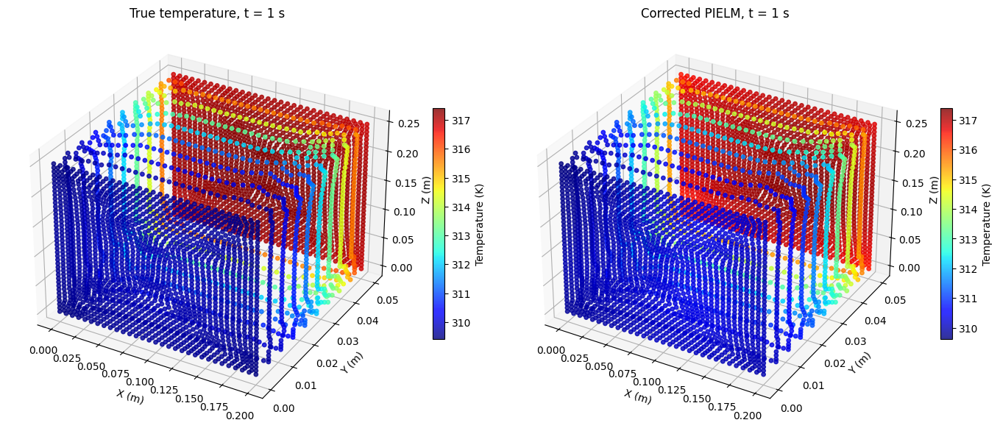

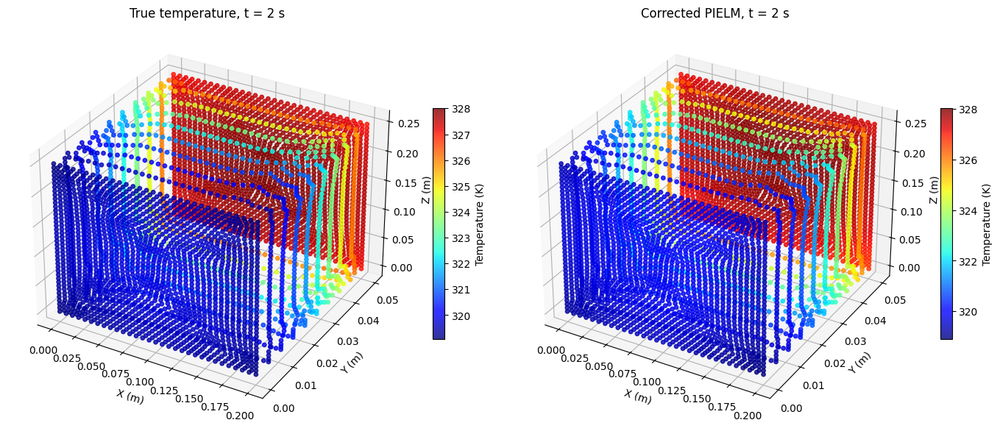

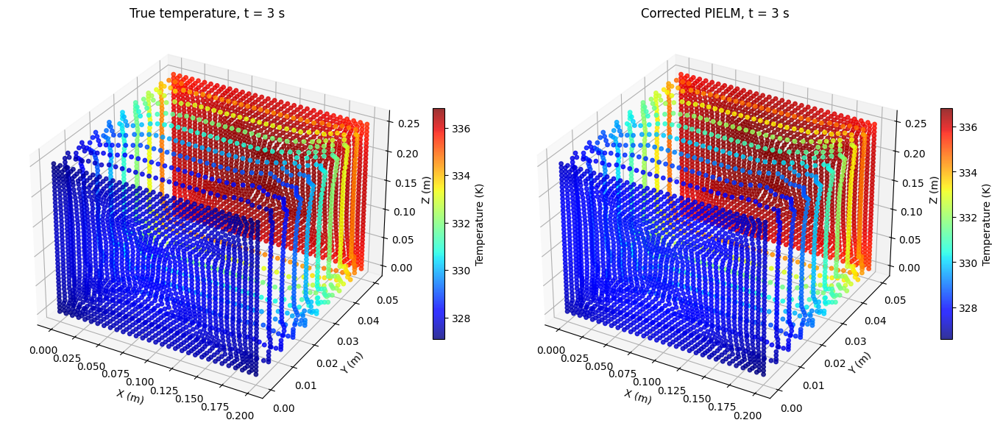

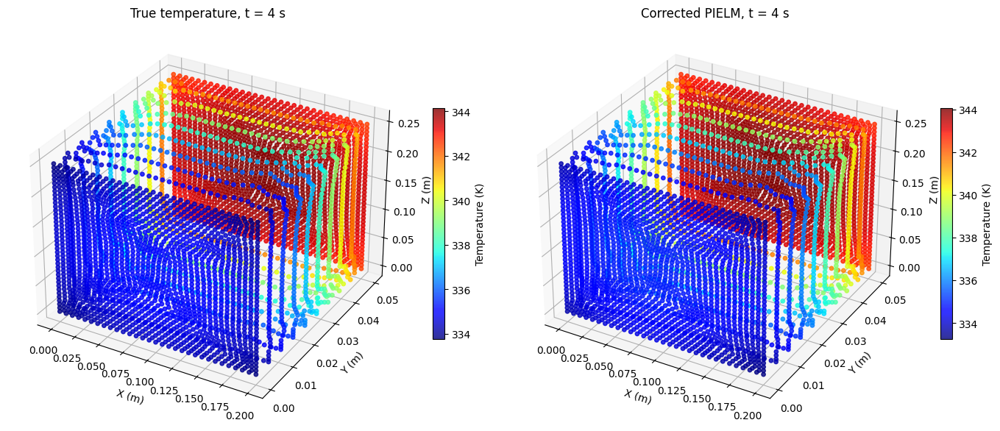

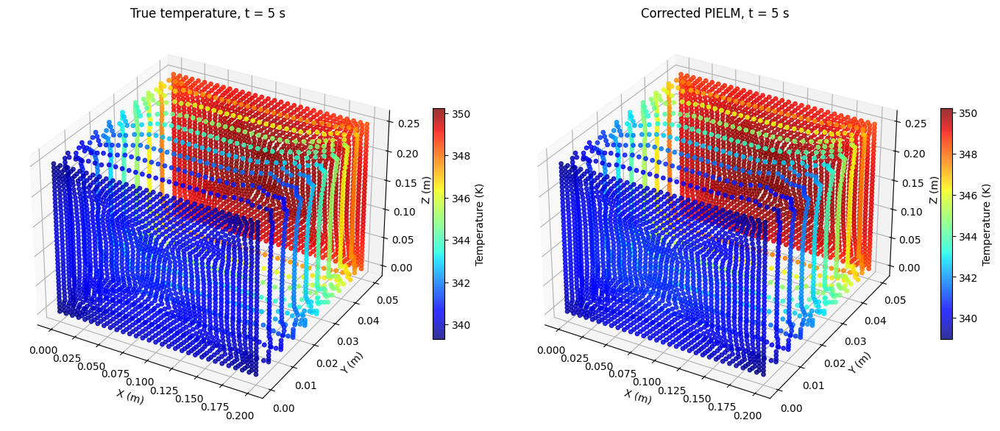

...

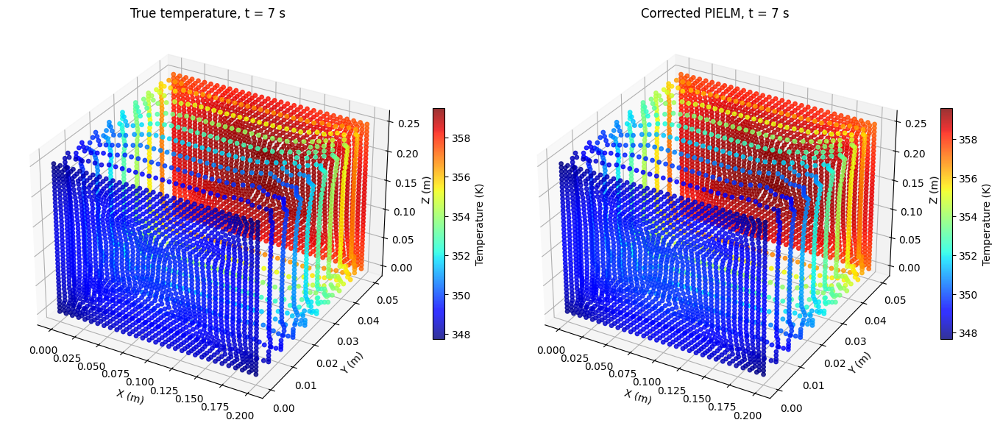

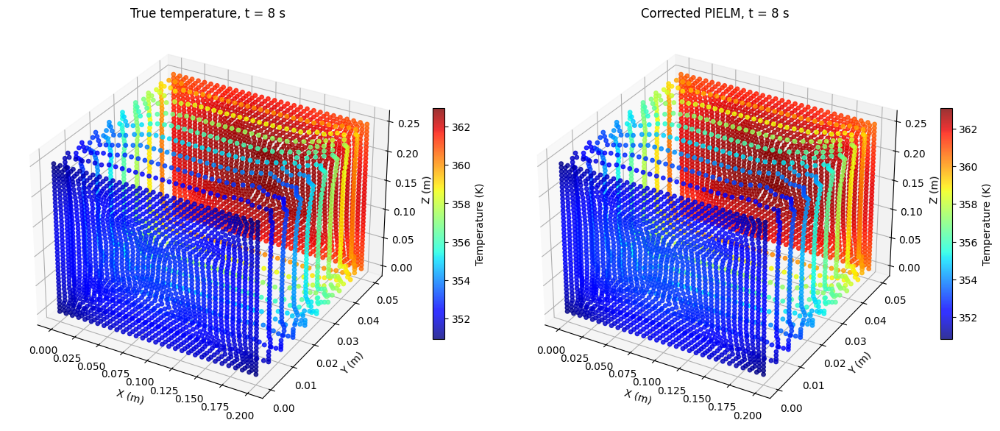

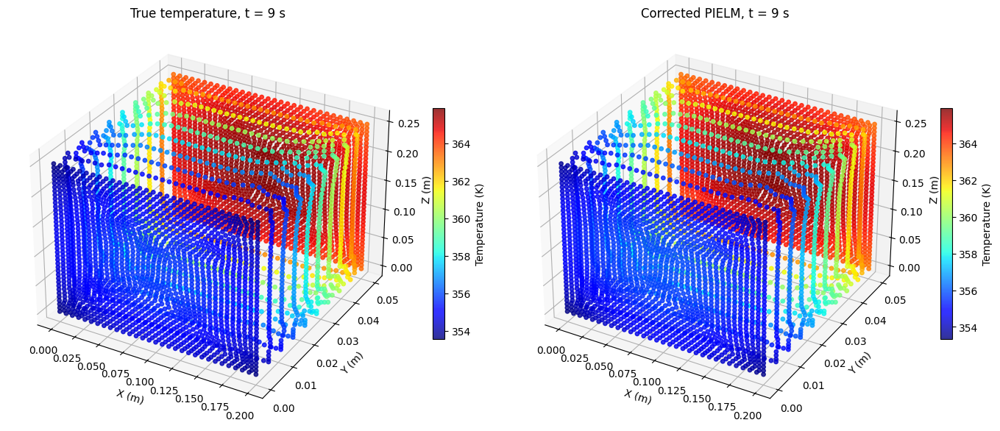

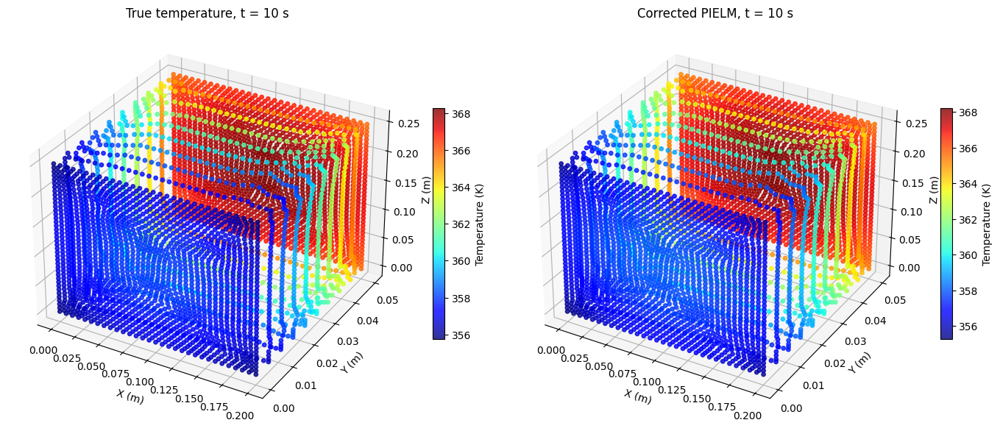

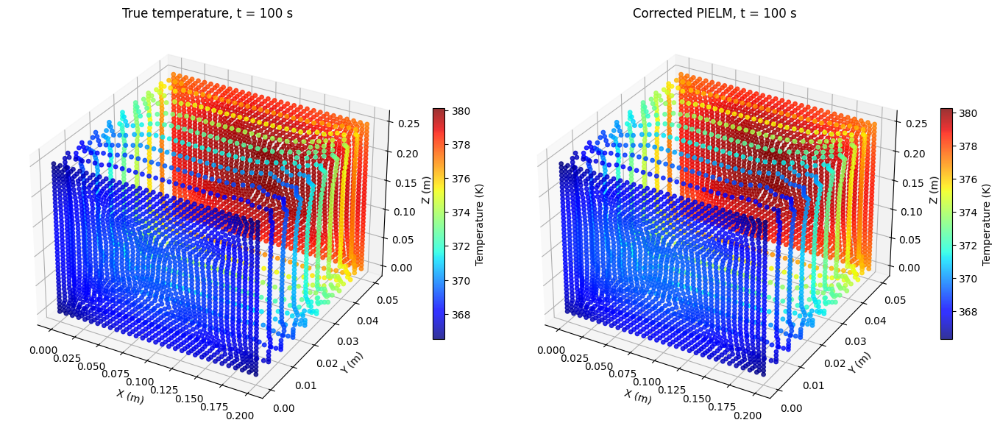

In [48]:

def plot_3d_comparison(time_value):
    mask = X_data[:, 3] == time_value
    Xs = X_data[mask]
    Ttrue = T_data[mask]
    Tpred = T_pred_all[mask]

    fig = plt.figure(figsize=(14, 6))

    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    sc1 = ax1.scatter(
        Xs[:, 0], Xs[:, 1], Xs[:, 2],
        c=Ttrue, cmap='jet', marker='o', s=15, alpha=0.8,
    )
    ax1.set_title(f'True temperature, t = {time_value:g} s')
    ax1.set_xlabel('X (m)')
    ax1.set_ylabel('Y (m)')
    ax1.set_zlabel('Z (m)')
    fig.colorbar(sc1, ax=ax1, shrink=0.55, label='Temperature (K)')

    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    sc2 = ax2.scatter(
        Xs[:, 0], Xs[:, 1], Xs[:, 2],
        c=Tpred, cmap='jet', marker='o', s=15, alpha=0.8,
    )
    ax2.set_title(f'Corrected PIELM, t = {time_value:g} s')
    ax2.set_xlabel('X (m)')
    ax2.set_ylabel('Y (m)')
    ax2.set_zlabel('Z (m)')
    fig.colorbar(sc2, ax=ax2, shrink=0.55, label='Temperature (K)')

    plt.tight_layout()
    plt.show()

for tt in np.unique(X_data[:, 3]):
    plot_3d_comparison(tt)


## 12. Optional sanity checks

In [49]:

# These checks catch the main implementation mistakes that affected the old notebook.
assert np.isclose(time_to_s(0.0), -1.0)
assert np.isclose(time_to_s(t_max), 1.0)
assert np.all(ds_dt(np.array([0.0, 1.0, 10.0, 100.0])) > 0.0)
assert X_ic[:, 3].max() == 0.0
assert model.c is not None
assert np.all(np.isfinite(model.c))
print('All basic PIELM sanity checks passed.')


All basic PIELM sanity checks passed.


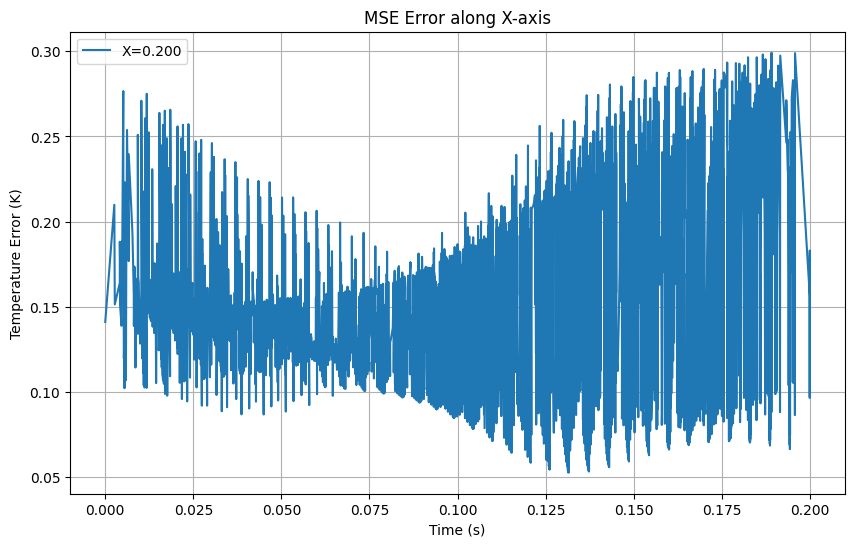

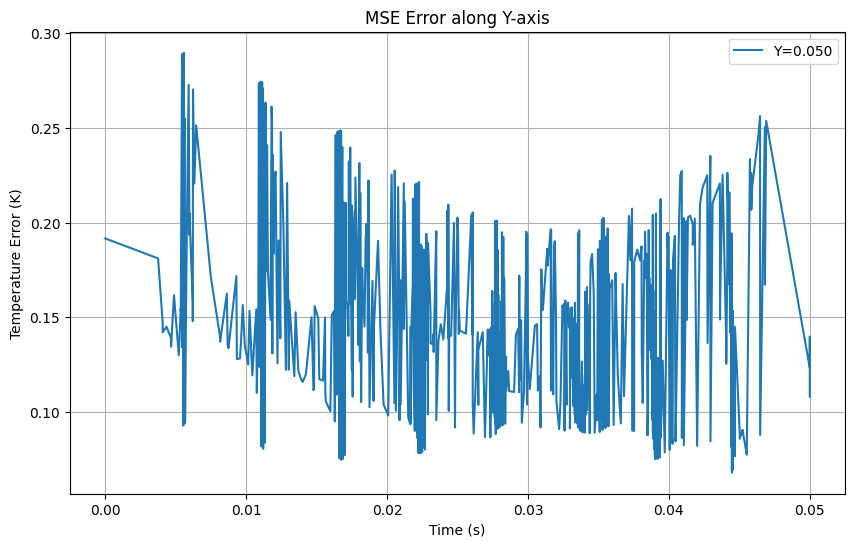

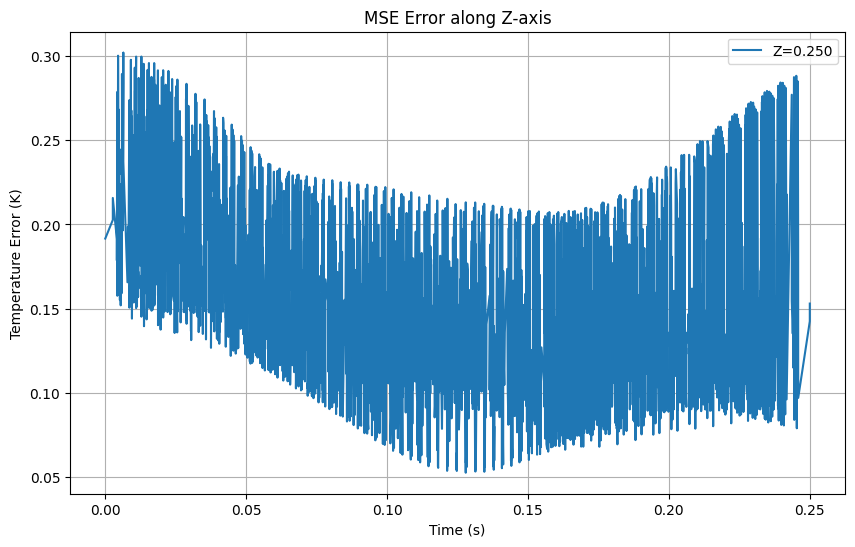

In [50]:
# plot error graph along 3 axes

unique_x = np.unique(X_data[:, 0])
unique_y = np.unique(X_data[:, 1])
unique_z = np.unique(X_data[:, 2])

def plot_error_along_axis(axis, unique_values, axis_name):
    plt.figure(figsize=(10, 6))
    errors = []
    for val in unique_values:
        mask = X_data[:, axis] == val
        Ttrue = T_data[mask]
        Tpred = T_pred_all[mask]
        errors.append(np.sqrt(np.mean((Ttrue - Tpred) ** 2)))
    plt.plot(unique_values, errors, label=f'{axis_name}={val:.3f}')
    
    plt.title(f'MSE Error along {axis_name}-axis')
    plt.xlabel('Time (s)')
    plt.ylabel('Temperature Error (K)')
    plt.legend()
    plt.grid()
    plt.show()

plot_error_along_axis(0, unique_x, 'X')
plot_error_along_axis(1, unique_y, 'Y')
plot_error_along_axis(2, unique_z, 'Z')


## Takeaways

1. **Exact initial-condition time:** the IC is enforced at **t = 0 s**, not at the first available data snapshot.
2. **Same train/validation/test split as the PINN:** 20 spatial sensor locations are selected with the same seed, and the remaining points are split into validation and test sets.
3. **Nondimensional temperature:** solve for `u = (T - T_inf) / T_scale` instead of directly solving for temperatures around 300 K. The PDE/BC equations are written consistently in `u`.
4. **Normalized spatial coordinates:** physical `(x, y, z)` are mapped to `[-1, 1]^3`, so random ELM weights no longer depend on metre-scale coordinate magnitudes.
5. **Log-stretched time coordinate:** a monotone transform maps physical `t in [0, 100] s` to `s in [-1, 1]` while allocating much more representational resolution to the first few seconds. The PDE uses the exact chain rule `u_t = u_s * ds/dt`.
6. **Transient-aware time sampling:** interior and boundary collocation points deliberately oversample `0–10 s`, where the thermal transient occurs, while retaining substantial coverage from `10–100 s`.
7. **Random features are sampled in normalized coordinates:** the previous physical-time `W_t ~ [-3.2, 3.2]` caused severe tanh saturation over a 100 s interval. The new fast-time features are defined in the normalized `s` coordinate instead.
8. **Operator-aware feature selection:** candidate random feature sets are ranked using a small combined PDE/BC/IC/data operator matrix, rather than only the raw hidden activation matrix.
9. **Dimensionless PDE scaling:** the PDE is multiplied by a characteristic diffusion time and divided by `rho*cp`, keeping the spatial and temporal operator coefficients near comparable numerical scales.
10. **Consistently scaled boundary equations:** convection and flux conditions are divided by natural physical scales before entering the least-squares system.
11. **Column normalization of the final linear system:** after block weighting, every feature column is normalized before solving. This prevents features with large operator derivatives from dominating the least-squares solve.
12. **Tikhonov regularization:** a small ridge term is added to the normalized linear system to reduce sensitivity to nearly dependent random features.
13. **Explicit constant basis function:** an additional constant basis column improves representation of the nonzero steady-state temperature offset in the transformed solution.
14. **Memory-safe collocation:** the original `30 x 30 x 30 x 11` tensor-product PDE grid is replaced by a controlled number of random collocation points. This avoids creating a very large dense matrix while giving better temporal coverage.
15. **Common test metrics and per-time diagnostics:** MSE/MAE are reported on the same held-out test set used by the PINN, together with errors at each available timestamp.

> **Important:** this is still a true PIELM: hidden-layer parameters are fixed random features and only the output coefficients are obtained from one regularized linear least-squares solve. No backpropagation training loop is used.
